In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

In [2]:
os.listdir("./data")

['uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jun14.csv']

In [3]:
df = pd.read_csv("./data/uber-raw-data-janjune-15.csv")

In [4]:
df_uber = df.copy()

In [5]:
df_uber.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14270479 entries, 0 to 14270478
Data columns (total 4 columns):
 #   Column                Dtype 
---  ------                ----- 
 0   Dispatching_base_num  object
 1   Pickup_date           object
 2   Affiliated_base_num   object
 3   locationID            int64 
dtypes: int64(1), object(3)
memory usage: 435.5+ MB


In [6]:
df_uber.shape

(14270479, 4)

In [7]:
df_uber.isnull().sum()

Dispatching_base_num         0
Pickup_date                  0
Affiliated_base_num     162195
locationID                   0
dtype: int64

In [8]:
df_uber["Affiliated_base_num"].isna().sum()

np.int64(162195)

In [9]:
df_uber.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [10]:
df_uber.duplicated().sum()

np.int64(898225)

In [11]:
df_uber = df_uber[~df_uber.duplicated()]

In [12]:
df_uber.shape

(13372254, 4)

In [13]:
df_uber["Pickup_date"] = pd.to_datetime(df_uber["Pickup_date"])

In [14]:
df_uber.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13372254 entries, 0 to 14270478
Data columns (total 4 columns):
 #   Column                Dtype         
---  ------                -----         
 0   Dispatching_base_num  object        
 1   Pickup_date           datetime64[ns]
 2   Affiliated_base_num   object        
 3   locationID            int64         
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 510.1+ MB


In [15]:
df_uber["Month_of_pickup"] = df_uber["Pickup_date"].dt.month_name()

In [16]:
df_uber.head(10)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,Month_of_pickup
0,B02617,2015-05-17 09:47:00,B02617,141,May
1,B02617,2015-05-17 09:47:00,B02617,65,May
2,B02617,2015-05-17 09:47:00,B02617,100,May
3,B02617,2015-05-17 09:47:00,B02774,80,May
4,B02617,2015-05-17 09:47:00,B02617,90,May
5,B02617,2015-05-17 09:47:00,B02617,228,May
6,B02617,2015-05-17 09:47:00,B02617,7,May
7,B02617,2015-05-17 09:47:00,B02764,74,May
8,B02617,2015-05-17 09:47:00,B02617,249,May
9,B02617,2015-05-17 09:47:00,B02764,22,May


In [17]:
data_months = df_uber.groupby("Month_of_pickup")["Month_of_pickup"].count()
data_months = data_months.sort_values(ascending = False)

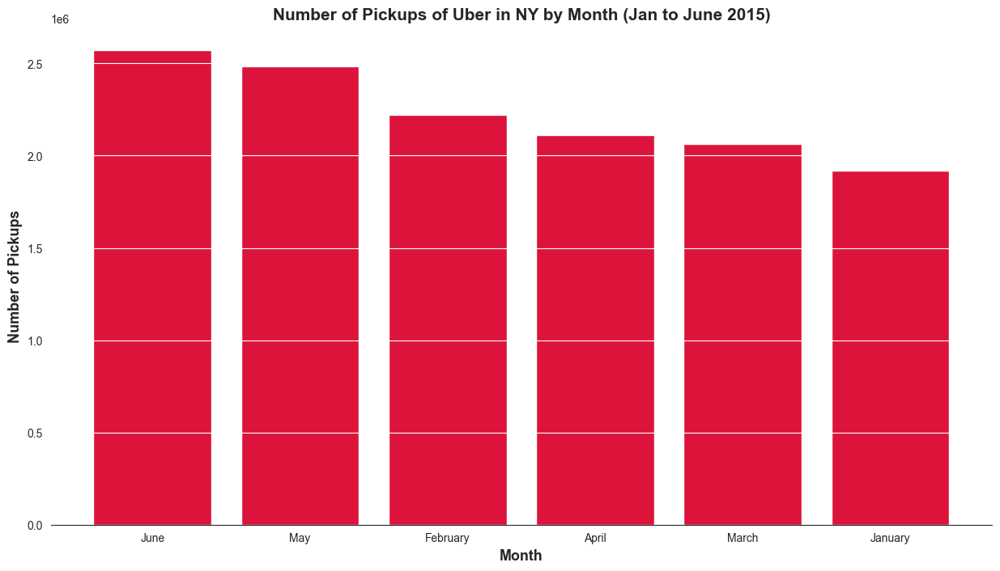

In [18]:
sns.set_style("white")
plt.figure(figsize = (15,8))
plt.bar(x = data_months.index,
        height = data_months,
        zorder = 0,
        color = "crimson"
       )
plt.xlabel("Month", fontsize = 13, weight = "bold")
plt.ylabel("Number of Pickups", fontsize = 13, weight = "bold")
plt.title("Number of Pickups of Uber in NY by Month (Jan to June 2015)", fontsize = 15, weight = "bold")
plt.grid(color = "white", visible = True, zorder = 1, axis = "y")
sns.despine(left = True)
plt.show()

In [19]:
df_uber["Day_of_pickup"] = df_uber["Pickup_date"].dt.day_name()
data_days_months = pd.crosstab(index = df_uber["Month_of_pickup"], columns = df_uber["Day_of_pickup"])
data_days_months

Day_of_pickup,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
Month_of_pickup,,,,,,,
April,315002,238429,324545,273560,372522,250632,338015
February,373550,274948,368311,296130,335603,287260,286387
January,339285,190606,386049,230487,330319,196574,245650
June,371225,375312,399377,334434,357782,405500,328141
March,309631,269931,314785,313865,277026,320634,256767
May,430134,255501,464298,390391,337607,290004,316045


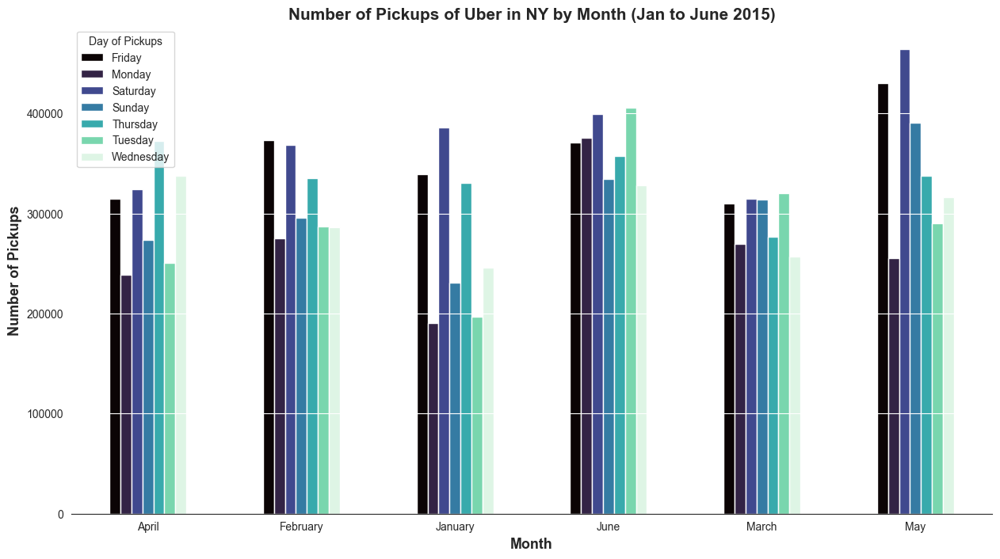

In [20]:
sns.set_style("white")
data_days_months.plot(kind = "bar",
        zorder = 0,
        figsize = (15,8),
        cmap = "mako"
       )
plt.xticks(rotation=0)
plt.xlabel("Month", fontsize = 13, weight = "bold")
plt.ylabel("Number of Pickups", fontsize = 13, weight = "bold")
plt.title("Number of Pickups of Uber in NY by Month (Jan to June 2015)", fontsize = 15, weight = "bold")
plt.grid(color = "white", visible = True, zorder = 1, axis = "y")
plt.legend(title = "Day of Pickups")
sns.despine(left = True)
plt.show()

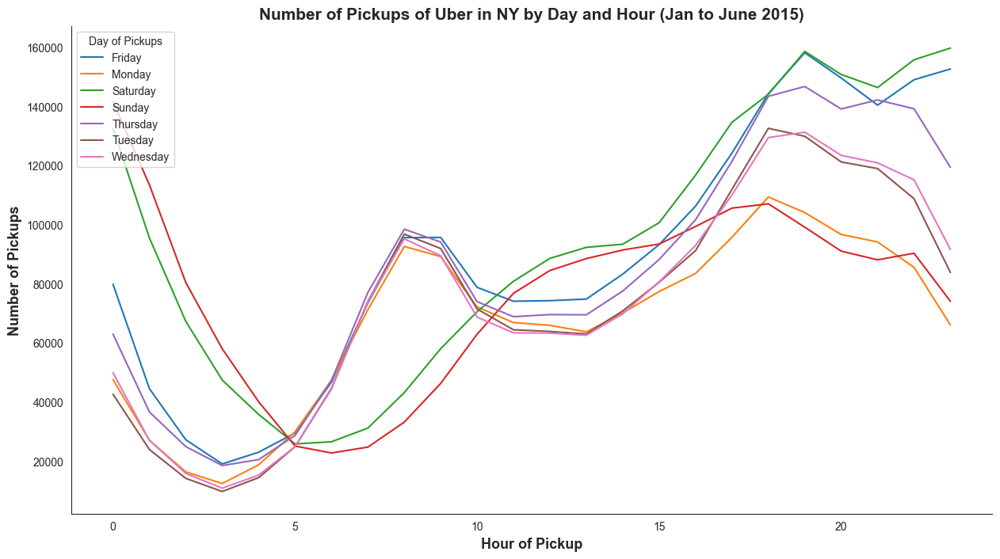

In [21]:
 # To suppress some warnings¨
import warnings
 # Suppress the specific FutureWarning
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

df_uber["Hour_of_pickup"] = df_uber["Pickup_date"].dt.hour
summary = df_uber.groupby(["Day_of_pickup", "Hour_of_pickup"], as_index = False).size()

plt.figure(figsize = (15,8))
sns.lineplot(x = "Hour_of_pickup", y = "size", data = summary, hue = "Day_of_pickup")
plt.xlabel("Hour of Pickup", fontsize = 13, weight = "bold")
plt.ylabel("Number of Pickups", fontsize = 13, weight = "bold")
plt.title("Number of Pickups of Uber in NY by Day and Hour (Jan to June 2015)", fontsize = 15, weight = "bold")
plt.legend(title = "Day of Pickups", loc = "upper left")
sns.despine()
plt.show()

In [31]:
files = os.listdir("./data/")[-8:]

In [32]:
files.remove("uber-raw-data-janjune-15.csv")
files.remove("uber-raw-data-janjune-15_sample.csv")

In [33]:
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [35]:
final = pd.DataFrame()
path = "./data/"

for file in files:
    current_df = pd.read_csv(path + file)
    final = pd.concat([current_df, final])

final
    

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512
...,...,...,...,...
564511,4/30/2014 23:22:00,40.7640,-73.9744,B02764
564512,4/30/2014 23:26:00,40.7629,-73.9672,B02764
564513,4/30/2014 23:31:00,40.7443,-73.9889,B02764
564514,4/30/2014 23:32:00,40.6756,-73.9405,B02764


In [37]:
final.duplicated().sum()

np.int64(82581)

In [38]:
final.drop_duplicates(inplace = True)

In [40]:
final.duplicated().sum()

np.int64(0)

In [41]:
final.head()

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512


In [58]:
final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4451746 entries, 0 to 564515
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Date/Time  object 
 1   Lat        float64
 2   Lon        float64
 3   Base       object 
dtypes: float64(2), object(2)
memory usage: 169.8+ MB


In [47]:
rush_uber = final.groupby(["Lat", "Lon"],   as_index = False).size()

In [48]:
rush_uber.head()

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1


In [52]:
import folium
from folium.plugins import HeatMap

In [56]:
basemap = folium.Map()

In [54]:
HeatMap(rush_uber).add_to(basemap)

In [55]:
basemap

In [65]:
final["datetime_col"] = pd.to_datetime(final["Date/Time"], format = "%m/%d/%Y %H:%M:%S")

In [66]:
final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4451746 entries, 0 to 564515
Data columns (total 7 columns):
 #   Column        Dtype         
---  ------        -----         
 0   Date/Time     object        
 1   Lat           float64       
 2   Lon           float64       
 3   Base          object        
 4   datetime_col  datetime64[ns]
 5   hour          int32         
 6   day           int32         
dtypes: datetime64[ns](1), float64(2), int32(2), object(2)
memory usage: 237.7+ MB


In [113]:
def generate_pivot_table(df, first, second):
    return df.groupby([first, second]).size().unstack()

In [115]:
pivot_final = generate_pivot_table(final, "day", "hour")
pivot_final.style.background_gradient()


hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203
